# Processing of the datasets

## 1. Imports and initial setup

In [14]:
%load_ext autoreload
%autoreload 1

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import path as mpath
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from tqdm.notebook import tqdm
from AirSeaFluxCode.AirSeaFluxCode import AirSeaFluxCode as asfc
import cmocean.cm as cmo
import seaborn as sns
import string
%aimport my_funcs

my_funcs.update_params(fontsize=24)

def fix_spines(ax,c,lw=3):
    for spine in ax.spines.values():
        spine.set_color(c)
        spine.set_linewidth(lw)
        spine.set_zorder(10)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 2. Data loading and pre-processing

In [23]:
def calculate_wind_direction(ds):
    ds["wind_from"] = (np.rad2deg(np.arctan2(ds["UWND_MEAN"], ds["VWND_MEAN"])) + 180) % 360
    ds["wind_to"] = np.rad2deg(np.arctan2(ds["UWND_MEAN"], ds["VWND_MEAN"])) % 360
    ds["wind_speed"] = ds["u10"].copy()
    return ds

# Load datasets
dataset_paths = ["../data/ds20qc_1min_height.nc", "../data/ds22qc_1min_height.nc", "../data/ds23qc_1min_height.nc"]
datasets = [calculate_wind_direction(xr.open_dataset(path)) for path in dataset_paths]
labels = ['SD1020', 'SD1022', 'SD1023']

# Define colors
colors = ["#C13F89", "#00B4D8", "#0077B6"]
c20, c22, c23 = colors

# Load the CMEMS data
cmems_jfm = xr.open_dataset("cmems_jfm.nc").mean("time").adt
cmems_mjj = xr.open_dataset("cmems_mjj.nc").mean("time").adt

# Assign individual datasets to variables
ds20, ds22, ds23 = datasets

for ds in datasets:
    ds["mday"] = (ds.time - ds.time[0]).dt.total_seconds() / 86400


In [3]:
def plot_acc_fronts_contours(ax, adt, acc=False, lw=1, ls="-", c="w", front_colors=None, stf=False):
    """
    Plot ACC fronts contours on the given axis.

    Parameters:
    ax (matplotlib.axes._subplots.AxesSubplot): The axis to plot on.
    adt (xarray.DataArray): The data array containing the ADT data.
    acc (bool): Whether to plot ACC fronts. Default is False.
    lw (int): Line width of the contours. Default is 1.
    ls (str): Line style of the contours. Default is "-".
    c (str): Color of the contours. Default is "w".
    front_colors (list): List of colors for the fronts. Default is None.
    stf (bool): Whether to include STF in the levels. Default is False.

    Returns:
    QuadContourSet: The contour set added to the axis.
    """
    if not acc:
        levels = [-1.14, -0.985, -0.61, -0.035, 0.35]  # SBDY, SAACF, PF, SAF
        linestyle = ':'
    else:
        if stf:
            levels = [-1.14, -0.985, -0.035, 0.35]  # SAACF, SAF, STF
            linestyle = [":", '--', "--", ":"]
        else:
            levels = [-0.985, -0.035]  # SAACF, SAF, STF
            linestyle = [ls, ls]

    return adt.plot.contour(
        levels=levels,
        ax=ax,
        zorder=2,
        transform=ccrs.PlateCarree(),
        colors=front_colors if front_colors else [c],
        linestyles=linestyle,
        linewidths=lw)

In [4]:
def plot_map(ax):
    """
    Plot the map with scatter points for each dataset and add features.

    Parameters:
    ax (cartopy.mpl.geoaxes.GeoAxes): The axis to plot on.
    """
    # Plot scatter points for each dataset
    for ds, c in zip(datasets, colors):
        ds.plot.scatter(x='longitude', y='latitude', c=c, s=25, ec='None', transform=ccrs.PlateCarree(), zorder=4, ax=ax)
    
    # Add land and coastline features
    ax.add_feature(cfeature.LAND.with_scale("50m"), color='0.8', zorder=2)
    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), color='k', zorder=3)
    
    # Set the extent of the map
    ax.set_extent([-180, 180, -90, -45], ccrs.PlateCarree())
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=False, color='None', zorder=1)
    gl.n_steps = 90
    
    # Add text annotations for each dataset
    for label, y, color, rotation in zip(labels, [-56, -45, -51], [c20, c22, c23], [-15, -17, -19]):
        ax.text(202, y, label, transform=ccrs.PlateCarree(), ha='center', va='center', c=color, fontweight='bold', rotation=rotation)
    
    # Remove the title
    ax.set_title('')

In [5]:
def get_mask(ds, var):
    return np.where(np.logical_and(np.isfinite(ds[var[0]]),
                                   np.logical_and(np.isfinite(ds[var[1]]),
                                                  np.logical_and(np.isfinite(ds[var[2]]),
                                                                 np.isfinite(ds[var[3]])))))[0]

def plot_fill(ax, ds, msk, y, c):
    gaps = np.where(np.diff(msk) > 60)[0]
    
    if len(gaps) == 0:
        ax.fill([ds.time[msk[0]].values, ds.time[msk[0]].values, ds.time[msk[-1]].values, ds.time[msk[-1]].values, ds.time[msk[0]].values],
                [10*y, 10*y-9, 10*y-9, 10*y, 10*y], fc=c, ec="None", zorder=2)
    else:
        ax.fill([ds.time[msk[0]].values, ds.time[msk[0]].values, ds.time[msk[gaps[0]]].values, ds.time[msk[gaps[0]]].values, ds.time[msk[0]].values],
                [10*y-0.5, 10*y-9-0.5, 10*y-9-0.5, 10*y-0.5, 10*y-0.5], fc=c, ec="None", zorder=2)
        ax.fill([ds.time[msk[gaps[-1]+1]].values, ds.time[msk[gaps[-1]+1]].values, ds.time[msk[-1]].values, ds.time[msk[-1]].values, ds.time[msk[gaps[-1]+1]].values],
                [10*y-0.5, 10*y-9-0.5, 10*y-9-0.5, 10*y-0.5, 10*y-0.5], fc=c, ec="None", zorder=2)
        
        for gap1, gap2 in zip(gaps, gaps[1:]):
            ax.fill([ds.time[msk[gap1+1]].values, ds.time[msk[gap1+1]].values, ds.time[msk[gap2]].values, ds.time[msk[gap2]].values, ds.time[msk[gap1+1]].values],
                    [10*y-0.5, 10*y-9-0.5, 10*y-9-0.5, 10*y-0.5, 10*y-0.5], fc=c, ec="None", zorder=2)

def temp_coverage_plot(ax, datasets, labels, colors, var):
    masks = []
    dm = []
    
    for ds, y, c, l, Y in zip(datasets, [3, 2, 1], colors, labels, 
                              [np.datetime64("2019-02-09"), np.datetime64("2019-05-22"), np.datetime64("2019-06-24")]):
        msk = get_mask(ds, var)
        masks.append(msk)
        dm.append(np.diff(msk))
        
        plot_fill(ax, ds, msk, y, c)
        ax.text(Y, 10*y-5, f" {l}", c="w", ha='left', fontweight="heavy", va='center', fontsize="large")
    
    ax.grid(zorder=1)
    ax.set(yticks=[], xlim=(np.datetime64("2018-12-31"), np.datetime64("2019-09-02")), xlabel='2019', title='Temporal coverage')
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    return masks, dm


## Figure 1

In [12]:
# Define file paths
image_path = '../figures/SD1020.jpeg'
save_path = "../figures/figure_1.png"

var = ['u10', 't2m', "TEMP_CTD_RBR_MEAN", "sensible"]

# Create a figure and a gridspec with two rows and two columns
fig = plt.figure(figsize=(20, 16), dpi=600)
gs = gridspec.GridSpec(2, 2, height_ratios=[4, 2], width_ratios=[1, 1])

# Create Cartopy subplot with SouthPolarStereo projection
ax = plt.subplot(gs[0, 0], projection=ccrs.SouthPolarStereo())
bx = plt.subplot(gs[0, 1])
cx = plt.subplot(gs[1:, :])

# Plot map and ACC fronts contours
plot_map(ax)
plot_acc_fronts_contours(ax, cmems_jfm, acc=True, lw=1, ls="-", c="0.5", front_colors=None, stf=False)
plot_acc_fronts_contours(ax, cmems_mjj, acc=True, lw=1, ls="--", c="0.5", front_colors=None, stf=False)

# Plot temporal coverage
masks, dm = temp_coverage_plot(cx, datasets, labels, colors, var)

# Display image in bx
bx.set(xticks=[], yticks=[])
img = mpimg.imread(image_path)
bx.imshow(img)

# Add text annotations
annotations = [
    (0.465, 0.925,0.035, "1", "Anemometer @ 3.8m"),
    (0.29, 0.78,-0.035, "2", "Meteorological\nprobe @ 3.6m"),
    (0.2, 0.05,0.035, "3", "Thermosalinograph @ 0.5m")
]
for x, y, dx, num, text in annotations:
    bx.text(x, y, num, c='k', bbox=dict(boxstyle='circle', facecolor='w', ec="k"), transform=bx.transAxes, ha='center', va='center')
    bx.text(x+dx, y, s=text, c='k' if num != "3" else 'w', transform=bx.transAxes, ha='left' if num != "2" else 'right', va='center')

# Customize spines
for spine in bx.spines.values():
    spine.set_color(c20)
    spine.set_linewidth(5)

# Add panel labels
panel_labels = [(ax, '(a)', "w", 0.05), (bx, '(b)', "k", 0.05), (cx, "(c)", "w", 0.025)]
for axs, p, c, x in panel_labels:
    axs.text(x, 0.95, p, ha='center', va='center', fontweight='bold', fontsize="large", c="k", transform=axs.transAxes)

fig.tight_layout()
# Uncomment the line below to save the figure
# plt.savefig(save_path, dpi=600)


/opt/miniconda3/envs/johan/lib/python3.12/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


**Figure 1**: (a) Track of the three Saildrone USVs (SD1020 (pink), SD1022 (cyan), and SD1023 (blue)). (b) Photo of SD1020 at the launch date on 19 January 2019, with numbers to indicate the position of key sensors used in this study (Photo from Saildrone Inc.). (c) An overview of the deployment period for which periods when we can derive sensible heat flux colored.

# Figure 3

In [26]:
fig, ax = plt.subplots(4,1,figsize=(16,12),sharex=True,constrained_layout=True, dpi=600)

variables = ["u10", "t2m", "TEMP_CTD_RBR_MEAN", "sensible"]
names     = ["Mean 10-m\nwind speed", "Mean 2-m\ntemperature", "Mean sea surface\ntemperature", "Mean sensible\nheat flux"]
names     = ["10-m wind speed", "2-m temperature", "Sea surface temperature", "Sensible heat flux"]
units     = ["m s$^{-1}$", "°C", "°C", "W m$^{-2}$"]
ylims     = [[0,25],[0,20],[0,20],[-300,75]]
ybounds   = [[0,20],[0,20],[0,20],[-300,150]]
ysteps    = [10,10,10,150]
ymsteps   = [5,5,5,75]
labels    = ["SD1020", "SD1022", "SD1023"]

for i,(ds,c,l) in enumerate(zip(datasets,colors,labels)):
    for j,(axs,v,n,u,yl,a,ys,ym,yb) in enumerate(zip(ax,variables,names,units,ylims,string.ascii_lowercase,ysteps,ymsteps,ybounds)):
        axs.axhline(0,ls=":",c="k",lw=1, zorder=1,clip_on=False)

        ds.set_coords("mday")[v].plot(ax=axs,c=c, lw=1, zorder=3-i, x="mday", clip_on=False)
        axs.set(ylabel=f"({u})",ylim=yl, xlim=(-20,90),yticks=np.arange(yl[0],yl[1]+1,ys))
        axs.set_xticks(np.arange(0,91,10),minor=True)
        axs.set_yticks(np.arange(yl[0],yl[1]+1,ym),minor=True)
        axs.set_xticks(np.arange(0,91,20),minor=False)
        axs.set_xlabel("", loc="left")
        axs.set_title(f"({a}) {n}",y=0.9, x=0.005, fontsize="small",loc="left")

        axs.text(0.0075, 0.3-i/8, f"{np.round(np.nanmean(ds[v]),1)} ± {np.round(np.nanstd(ds[v]),1)} {u}",
                 fontweight="bold", c=c, ha="left", transform=axs.transAxes,fontsize="x-small")
        # if j > 0:
        axs.spines["top"].set_visible(False)
        axs.spines["right"].set_visible(False)
        if j < 3:
            axs.xaxis.set_visible(False)
            axs.spines["bottom"].set_visible(False)

axs.spines['bottom'].set_bounds(-20,90)
axs.set_xlabel("Mission day")

plt.savefig("../figures/usv-timeseries.png",dpi=600)
plt.close()

**Figure 2**: Time series of observed (a) 10-m wind speed, (b) 2-m air temperature, (c) sea surface temperature, and (d) sensible heat flux. Colored lines represents the different Saildrone missions: SD1020 (pink), SD1022 (cyan), and SD1023 (blue). Mean values and standard deviations for each variable are annotated in corresponding colors.

In [27]:
import dask
def match_ssh_values_parallel(ds, sshm, lat_var='latitude', lon_var='longitude', ssh_var='ssh', chunk_size=1000):
    """
    Match and assign SSH values from 'sshm' to the dataset 'ds' based on latitude and longitude,
    with parallel processing using dask and progress tracking using tqdm.

    Parameters:
    ds (xarray.Dataset): The dataset to which SSH values will be assigned.
    sshm (xarray.DataArray): SSH data array with latitude and longitude dimensions.
    lat_var (str): The name of the latitude variable in the dataset. Default is 'latitude'.
    lon_var (str): The name of the longitude variable in the dataset. Default is 'longitude'.
    ssh_var (str): The name of the new SSH variable to be added to the dataset. Default is 'ssh'.
    chunk_size (int): Size of chunks for parallel processing. Default is 1000.

    Returns:
    xarray.Dataset: The dataset with an added SSH variable.
    """
    
    # Extract latitudes and longitudes from the dataset
    latitudes = ds[lat_var].values
    longitudes = ds[lon_var].values
    
    # Split the data into chunks for parallel processing
    num_chunks = len(latitudes) // chunk_size + 1
    chunks = np.array_split(np.arange(len(latitudes)), num_chunks)
    
    # Function to process each chunk
    def process_chunk(chunk):
        return [sshm.sel(latitude=latitudes[i], longitude=longitudes[i], method="nearest").values for i in chunk]

    # Create delayed tasks for each chunk
    tasks = [dask.delayed(process_chunk)(chunk) for chunk in chunks]
    
    # Compute the results in parallel, using tqdm to track progress
    with tqdm(total=len(latitudes), desc="Matching SSH values") as pbar:
        results = dask.compute(*tasks, scheduler='processes', progress_bar=False)
        pbar.update(len(latitudes))
    
    # Flatten the results and assign to a new DataArray in the dataset
    ssh_values = np.concatenate(results)
    ds[ssh_var] = xr.DataArray(ssh_values, dims=["time"])

    return ds

In [31]:
ds20 = match_ssh_values_parallel(ds20, cmems_jfm)
ds22 = match_ssh_values_parallel(ds22, cmems_mjj)
ds23 = match_ssh_values_parallel(ds23, cmems_mjj)

ds20.to_netcdf("/tmp/ds20qc_1min_height_with_ssh.nc")
ds22.to_netcdf("/tmp/ds22qc_1min_height_with_ssh.nc")
ds23.to_netcdf("/tmp/ds23qc_1min_height_with_ssh.nc")

Matching SSH values:   0%|          | 0/95624 [00:00<?, ?it/s]

Matching SSH values:   0%|          | 0/128102 [00:00<?, ?it/s]

Matching SSH values:   0%|          | 0/126832 [00:00<?, ?it/s]

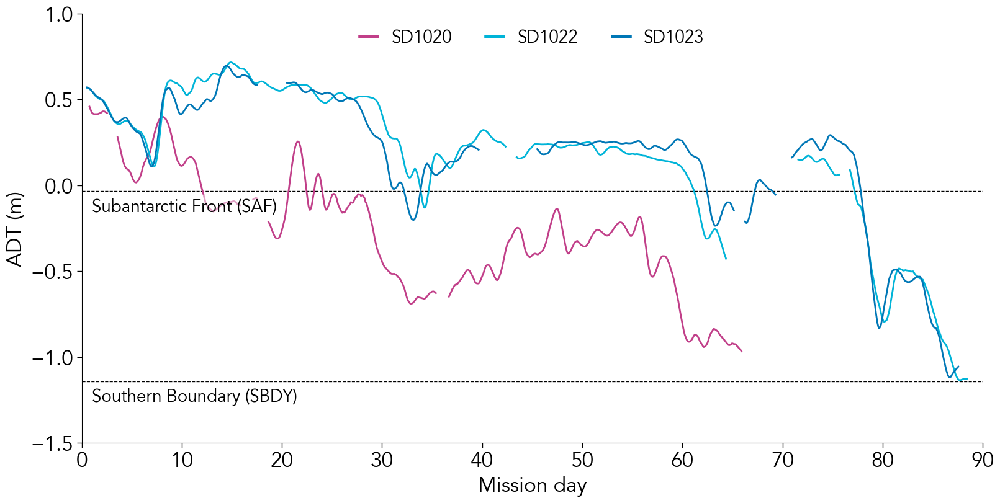

In [45]:
def plot_fronts(ax, fronts, names, xlims):
    """Add horizontal dashed lines and text for fronts."""
    for i, (front, name) in enumerate(zip(fronts, names)):
        if name in ["Subantarctic Front (SAF)", "Southern Boundary (SBDY)"]:
            ax.text(1, front - 0.04, name, ha='left', va='top', fontsize="small", bbox=dict(facecolor='w', edgecolor='w', alpha=0.5))
            ax.axhline(front, color='black', linestyle='--', linewidth=1)

# Define fronts, names, and colors for filling
fronts = [1, -0.035, -0.61, -0.985, -1.14, -1.5]
names = ["Equator", "Subantarctic Front (SAF)", "Polar Front (PF)", "Southern Antarctic Circumpolar Current Front (SAACF)", "Southern Boundary (SBDY)", "Antarctica"]
fill_colors = [plt.get_cmap("cmo.thermal_r",8)(i+1)[:3] for i in range(6)]

fig, ax = plt.subplots(1, 1, figsize=(16, 8), constrained_layout=True)
ax.set(ylim=(-1.5, 1))

# Plot time series and rolling mean for sensible heat flux data only
for ds, c, l in zip(datasets, colors, labels):
    sensible_mask = np.isfinite(ds['sensible'])
    ds.where(sensible_mask).set_coords("mday")["ssh"].rolling(time=60*24, center=True).mean("time").plot(
        x="mday", ax=ax, lw=2, linestyle="-", color=c, zorder=3, label=l)

# Get axis limits
xlims = ax.get_xlim()

# Plot lines and text for fronts
plot_fronts(ax, fronts, names, xlims)

# Set labels and limits
ax.set(xlim=[0, 90], ylim=(-1.5, 1), ylabel="ADT (m)", xlabel="Mission day")
leg = ax.legend(frameon=False, ncols=3, loc="upper center", handlelength=1, fontsize="small") 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for line in leg.get_lines():
    line.set_linewidth(4)

In [39]:
names = ["north of", "in SAZ", "in ACC"]
fronts = [1, -0.035, -1.14, -1.5]

for ds, label in zip([ds20, ds22, ds23], labels):
    print(f"{label} spent {np.round(np.logical_and(ds.ssh >= -0.035, ds.ssh < 1).values.sum()/1440, 1)} days in the SAZ")
    print(f"{label} spent {np.round(np.logical_and(ds.ssh < -0.035, ds.ssh >= -1.5).values.sum()/1440, 1)} days in the ACC")
    print("")


SD1020 spent 15.0 days in the SAZ
SD1020 spent 51.4 days in the ACC

SD1022 spent 67.1 days in the SAZ
SD1022 spent 21.9 days in the ACC

SD1023 spent 70.4 days in the SAZ
SD1023 spent 17.7 days in the ACC



In [40]:
def plot_acc(ax):
    # Plot the fronts with the defined colors
    cs = sshm.plot.contourf(
        levels=[#-1.14,  # SBDY
                -0.985,  # SAACF
                #-0.61,   # PF
                -0.035,  # SAF
                ],    # Latitude limit (-30 degrees)
        ax=ax,
        zorder=3,
        transform=ccrs.PlateCarree(),
        colors=[fill_colors[2],
                #fill_colors[3],  # South of SBDY (blue)
                fill_colors[3],  # Between SAACF and PF (light blue)
                #fill_colors[1]],  # Between PF and SAF (light red)
                fill_colors[1]], # North of SAF (red)
        linestyles='-',alpha=0.5, add_colorbar=False
    )
    
    cs = sshm.plot.contour(
        levels=[#-1.14,  # SBDY
                -0.985,  # SAACF
                #-0.61,   # PF
                -0.035,  # SAF
                ],    # Latitude limit (-30 degrees)
        ax=ax,
        zorder=3,
        transform=ccrs.PlateCarree(),
        colors=[fill_colors[4],
                #fill_colors[3],  # South of SBDY (blue)
                #fill_colors[1]],  # Between PF and SAF (light red)
                fill_colors[0]], # North of SAF (red)
        linestyles=':',
        linewidths=0.75
    )
    
    # Scatter plot for ds20, ds22, ds23 with respective colors
    ds20.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c20, ec="None", s=5, zorder=4,ax=ax)
    ds22.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c22, ec="None", s=5, zorder=4,ax=ax)
    ds23.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c23, ec="None", s=5, zorder=4,ax=ax)

    # Optional: Customize further (title, labels, etc.)
    circ_bound(ax)
    ax.add_feature(cfeature.LAND.with_scale("50m"), color='0.9',zorder=4)
    ax.coastlines(lw=0.5, resolution='50m', ec="k",zorder=5)

    
def plot_acc_fronts(ax, circular=True):
    # Plot the fronts with the defined colors
    cs = sshm.plot.contourf(
        levels=[-1.14,  # SBDY
                -0.985,  # SAACF
                -0.61,   # PF
                -0.035,  # SAF
                ],    # Latitude limit (-30 degrees)
        ax=ax,
        zorder=3,
        transform=ccrs.PlateCarree(),
        colors=[fill_colors[2],
                fill_colors[4],  # South of SBDY (blue)
                fill_colors[3],  # Between SAACF and PF (light blue)
                fill_colors[1],  # Between PF and SAF (light red)
                fill_colors[0]], # North of SAF (red)
        linestyles='-',alpha=0.15, add_colorbar=False
    )
    
    cs = sshm.plot.contour(
        levels=[-1.14,  # SBDY
                -0.985,  # SAACF
                -0.61,   # PF
                -0.035,  # SAF
                ],    # Latitude limit (-30 degrees)
        ax=ax,
        zorder=3,
        transform=ccrs.PlateCarree(),
        colors=[fill_colors[4],
                fill_colors[3],  # South of SBDY (blue)
                fill_colors[1],  # Between PF and SAF (light red)
                fill_colors[0]], # North of SAF (red)
        linestyles=':',
        linewidths=0.75
    )
    
    # Scatter plot for ds20, ds22, ds23 with respective colors
    ds20.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c20, ec="None", s=5, zorder=4,ax=ax)
    ds22.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c22, ec="None", s=5, zorder=4,ax=ax)
    ds23.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c23, ec="None", s=5, zorder=4,ax=ax)
    # Optional: Customize further (title, labels, etc.)
    if circular:
        circ_bound(ax)
    ax.add_feature(cfeature.LAND.with_scale("50m"), color='0.9',zorder=4)
    ax.coastlines(lw=0.5, resolution='50m', ec="k",zorder=5)

    ax.scatter(142,-47,fc="#00028C", transform=ccrs.PlateCarree(),marker="o",ec="w", lw=2, zorder=5, s=100)
    ax.scatter(-89.28,-54.47,fc="#EF6A0A", transform=ccrs.PlateCarree(),marker="o",ec="w", lw=2, zorder=5, s=100)
    


In [41]:
def circ_bound(ax,x1=0,x2=2*np.pi):
    
    theta = np.linspace(x1, x2, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)

In [42]:
def plot_acc_fronts(ax, circular=True, fill=True,ls="-", lw=1, land=True ,mooring=True,split=False, summer=True, acc=False, usvs=True, lc="w", ec="k",x1=-180,x2=180):
    # Plot the fronts with the defined colors
    if summer:
        adt = cmems_jfm.sel(longitude=slice(x1,x2))
    else:
        adt = cmems_mjj
    if not acc:
        if fill:
            cs = adt.plot.contourf(
                levels=[-1.14,  # SBDY
                        -0.985,  # SAACF
                        -0.61,   # PF
                        -0.035,  # SAF
                         0.3,    #STF
                        ],    # Latitude limit (-30 degrees)
                ax=ax,
                zorder=3,
                transform=ccrs.PlateCarree(),
                # colors=[fill_colors[4],
                #         fill_colors[3],  # South of SBDY (blue)
                #         fill_colors[2],  # Between SAACF and PF (light blue)
                #         fill_colors[1],  # Between PF and SAF (light red)
                #         fill_colors[0]], # North of SAF (red)
                colors=fill_colors[::-1], # North of SAF (red)
                linestyles='',alpha=0.75, add_colorbar=False
            )

        else:
            front_colors = [ec]
            
        cs = adt.plot.contour(
            levels=[-1.14,  # SBDY
                    -0.985,  # SAACF
                    -0.61,   # PF
                    -0.035,  # SAF
                     0.3,    # STF
                    ],    # Latitude limit (-30 degrees)
            ax=ax,
            zorder=4,
            transform=ccrs.PlateCarree(),
            colors = fill_colors[::-1][1:], # North of SAF (red)
            linestyles='-',
            linewidths=lw
        )            
        cs = cmems_mjj.plot.contour(
            levels=[-1.14,  # SBDY
                    -0.985,  # SAACF
                    -0.61,   # PF
                    -0.035,  # SAF
                     0.3,    # STF
                    ],    # Latitude limit (-30 degrees)
            ax=ax,
            zorder=4,
            transform=ccrs.PlateCarree(),
            colors = fill_colors[::-1][1:], # North of SAF (red)
            linestyles='--',
            linewidths=1
        )
    else:
        cs = adt.plot.contour(
                                levels=[#-1.14,  # SBDY
                                        -0.985,  # SAACF
                                        #-0.61,   # PF
                                        -0.035,  # SAF
                                        ],    # Latitude limit (-30 degrees)
                                ax=ax,
                                zorder=4,
                                transform=ccrs.PlateCarree(),
                                colors = [ec], # North of SAF (red)
                                linestyles=ls,
                                linewidths=lw
                            )
    if usvs:
        
        # Scatter plot for ds20, ds22, ds23 with respective colors
        if split:
            if summer:
                ds20.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c20, ec="None", s=5, zorder=4,ax=ax)
            else:
                ds22.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c22, ec="None", s=5, zorder=4,ax=ax)
                ds23.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c23, ec="None", s=5, zorder=4,ax=ax)
        else:
            ds20.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c20, ec="None", s=5, zorder=4,ax=ax)
            ds22.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c22, ec="None", s=5, zorder=4,ax=ax)
            ds23.plot.scatter(x="longitude", y="latitude", transform=ccrs.PlateCarree(), c=c23, ec="None", s=5, zorder=4,ax=ax)

    if mooring:
        ax.scatter(142,-47,fc="#00028C", transform=ccrs.PlateCarree(),marker="o",ec="w", lw=2, zorder=5, s=100)
        ax.scatter(-89.28,-54.47,fc="#EF6A0A", transform=ccrs.PlateCarree(),marker="o",ec="w", lw=2, zorder=5, s=100)

    # Optional: Customize further (title, labels, etc.)
    if circular:
        circ_bound(ax)
    
    if land:
        ax.add_feature(cfeature.LAND.with_scale("50m"), color=lc, zorder=4)
        ax.add_feature(cfeature.COASTLINE.with_scale("50m"), edgecolor=ec, linewidth=1, zorder=5)  # Coastlines in white
    
    


In [43]:
def get_cmap(half=False):
    """
    Create and return a custom colormap for visualizations.

    This function generates a linear segmented colormap that transitions through a specified 
    set of colors, ordered from dark red to dark blue. The colormap is defined using 
    hexadecimal color codes and is intended for use in visualizations where a smooth 
    transition between these colors is desired.

    Returns
    -------
    cmap : matplotlib.colors.LinearSegmentedColormap
        A custom colormap object that can be used in plotting functions to map data values 
        to colors.

    Notes
    -----
    - The colormap transitions through the following colors (in reverse order for the final colormap):
      '#053061', '#2166ac', '#4393c3', '#92c5de', '#d1e5f0', '#f7f7f7', 
      '#fddbc7', '#f4a582', '#d6604d', '#b2182b', '#67001f'.
    - The resulting colormap can be applied to any data visualization that supports colormaps, 
      such as those created with matplotlib.
    
    Example
    -------
    >>> cmap = get_cmap()
    >>> plt.imshow(data, cmap=cmap)
    >>> plt.colorbar()
    """
    
    # Define the colors in the order you've specified
    if half:
        colors = ['#67001f', '#b2182b', '#d6604d', '#f4a582', '#fddbc7', '#f7f7f7']
    else:
        colors = ['#67001f', '#b2182b', '#d6604d', '#f4a582', '#fddbc7', '#f7f7f7', '#d1e5f0', '#92c5de', '#4393c3', '#2166ac', '#053061']
        
    # Create a colormap that transitions from the first color to the last
    cmap_name = 'custom_cmap'
    cmap = LinearSegmentedColormap.from_list('custom_cmap', colors[::-1])
    return cmap

cmap_half = get_cmap(half = True)
cmap = get_cmap(half = False)

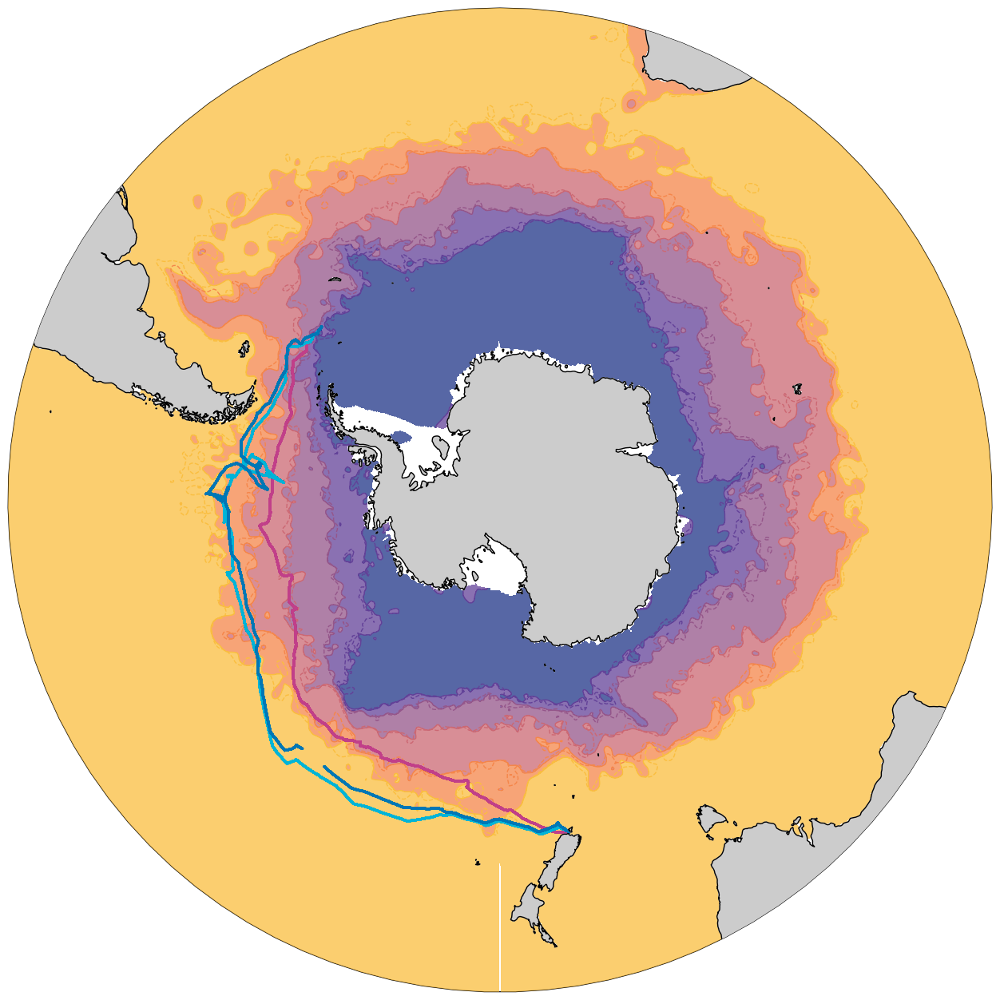

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16), subplot_kw={'projection': ccrs.SouthPolarStereo()})

plot_acc_fronts(ax,lc="0.8",mooring=False)


plt.show()

In [73]:
ds20saz = ds20.where(ds20.ssh >= -0.035, drop=True)
ds20acc = ds20.where(ds20.ssh < -0.035, drop=True)

ds22saz = ds22.where(ds22.ssh >= -0.035, drop=True)
ds22acc = ds22.where(ds22.ssh < -0.035, drop=True)

ds23saz = ds23.where(ds23.ssh >= -0.035, drop=True)
ds23acc = ds23.where(ds23.ssh < -0.035, drop=True)

In [74]:
saz_ds = [ds20saz,ds22saz,ds23saz]
acc_ds = [ds20acc,ds22acc,ds23acc]

In [130]:
for saz,acc in zip(saz_ds,acc_ds):

    saz["deltaT"] = saz["t2m"] - saz["TEMP_CTD_RBR_MEAN"]
    acc["deltaT"] = acc["t2m"] - acc["TEMP_CTD_RBR_MEAN"]
for ds in datasets:
    ds["deltaT"] = ds["t2m"] - ds["TEMP_CTD_RBR_MEAN"]

# Figure 4

In [ ]:
variables = ['u10', 't2m', 'TEMP_CTD_RBR_MEAN',"deltaT", 'sensible']
titles = ['10-m wind speed', '2-m air temperature', 'Sea surface temperature',"Temperature difference", 'Sensible heat flux']
units  = ["m s$^{-1}$", "°C", "°C", "°C", r"W m$^{-2}$"]
ylims  = [[0,26],[-5,20],[-5,20],[-7,3],[-200,50]]
xticks = [[0,25],[0,21],[0,21],[-5,3],[-200,50]]
xsteps = [10,10,10,5,100]
ymax   = [0.15,0.3,0.6,0.4,0.03] 

fig = plt.figure(figsize=(20,14), layout="constrained", dpi=600)
gs = GridSpec(4, 5, figure=fig)

map_ax = fig.add_subplot(gs[:2, :], projection=ccrs.PlateCarree(central_longitude=240))

AX = [[fig.add_subplot(gs[2, i]) for i in range(5)],
    [fig.add_subplot(gs[3, i]) for i in range(5)]]

def plot_kde(ax, zone, variable, name, color, k):
    sns.kdeplot(data=zone[variable], label=name, color=color, ls="-", lw=2, zorder=2, ax=ax)
    if "sensible" in variable:
        ax.text(0.05, 0.8 - k / 10, f"n={len(zone.time)}", c=color, transform=ax.transAxes, ha="left", va="top")

def configure_ax(ax, i, j, unit, ylim, ym, xstep, xtick, title):
    ax.set(
        xlabel=f"({unit})" if i == 1 else "",
        ylabel="PDF" if j == 0 else "",
        xlim=ylim,
        ylim=[0, ym],
        xticks=np.arange(xtick[0], xtick[1], xstep)
    )
    ax.set_title(title if i == 0 else "", fontsize="small", pad=25)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    if variable != "u10":
        ax.axvline(0, ls="--", lw=1, c="k", zorder=1)
    if i == 0:
        plt.setp(ax.get_xticklabels(), visible=False)

for i, (AXS, zones, name) in enumerate(zip(AX, [saz_ds, acc_ds], ["SAZ", "ACC"])):
    for j, (axs, variable, title, unit, ylim, xstep, xtick, ym) in enumerate(zip(AXS, variables, titles, units, ylims, xsteps, xticks, ymax)):
        for k, (zone, color) in enumerate(zip(zones, colors)):
            plot_kde(axs, zone, variable, name, color, k)
        configure_ax(axs, i, j, unit, ylim, ym, xstep, xtick, title)

for ds, season, linestyle in zip([cmems_jfm, cmems_mjj], [True, False], ["-", "--"]):
    plot_acc_fronts(map_ax, circular=False, fill=False, lw=1, split=False, summer=season, acc=True, usvs=season, ls=linestyle, land=not season, mooring=False, lc="0.8", ec="k")

map_ax.set_extent([240-100,240+100,-75,-30],crs=ccrs.PlateCarree())
gl = map_ax.gridlines(draw_labels=True, zorder=1, lw=0)

gl.top_labels=False
gl.right_labels=False
gl.bottom_labels=True
fix_spines(map_ax,"k", lw=1)
#plot_nice_box(axs,[-60, -50],[160,280],c="w")

map_ax.text(0.01,0.03,"(a)",transform=map_ax.transAxes,
            zorder=100, ha="left", va="bottom",fontsize="small",
            bbox=dict(facecolor='w', edgecolor='None', boxstyle='square',alpha=0.5))
for axs,letter in zip(np.asarray(AX).T.flatten(), string.ascii_lowercase[1:]):
    axs.text(0.05,0.9,f"({letter})",transform=axs.transAxes,
          zorder=100, ha="left", va="bottom",fontsize="small",
          bbox=dict(facecolor='w', edgecolor='None', boxstyle='square',alpha=0.5))

regions = ["SAZ", "ACC", "MIZ"]
latitudes = [-50, -57, -64]

for region, lat in zip(regions, latitudes):
    map_ax.text(155, lat, region, ha="center", va="center", transform=ccrs.PlateCarree(), fontsize="small", c="r", fontweight="bold")

lines = [Line2D([0], [0], label=label, color=color, lw=4) for label, color in zip(labels, colors)]
leg = map_ax.legend(handles=lines, loc="upper center", frameon=False, ncols=3, fontsize="small", handlelength=1)

AX[0][0].text(20,0.1,"SAZ",ha="center",va="center",c="r")
AX[1][0].text(20,0.1,"ACC",ha="center",va="center",c="r")

plt.tight_layout=True
#plt.savefig("../figures/hist-maps.png", dpi=600, pad_inches=1)

In [132]:
variable = "sensible"

def get_plot_params(variable):
    params = {
        "sensible": {
            "ylims": [-100, 70],
            "ystep": 50,
            "ybounds": [-100, 50],
            "ylabel": r"Sensible heat flux (W m$^{-2}$)",
            "text": ["Sensible heat gain", "Sensible heat loss"],
            "texty": 3
        },
        "deltaT": {
            "ylims": [-5, 2],
            "ybounds": [-5, 2],
            "ystep": 1,
            "ylabel": r"Delta T (T$_{air}$ - SST) (°C)",
            "text": ["Colder ocean", "Colder atmosphere"],
            "texty": 0.15
        },
        "u10": {
            "ylims": [0, 25],
            "ybounds": [0, 20],
            "ystep": 5,
            "ylabel": r"Wind speed (m s$^{-1}$)",
            "text": ["", ""],
            "texty": 0
        }
    }
    return params.get(variable, {})

def calculate_means_stds(datasets, variable):
    means, stds, means_acc, stds_acc, n_saf, n_acc = [], [], [], [], [], []
    wind_dir_grid = np.arange(0, 360, 30)
    
    for ds in datasets:
        m1, std1, n1 = calculate_stats(ds.where(~(ds.ssh < -0.035)), variable, wind_dir_grid)
        m2, std2, n2 = calculate_stats(ds.where((ds.ssh < -0.035)), variable, wind_dir_grid)
        
        means.append(m1)
        stds.append(std1)
        means_acc.append(m2)
        stds_acc.append(std2)
        n_saf.append(n1)
        n_acc.append(n2)
    
    return means, stds, means_acc, stds_acc, n_saf, n_acc

def plot_error_bars(ax, wind_dir_grid, means, stds, means_acc, stds_acc, colors, labels, n_saf, n_acc, saz, acc, plot_n, ylims):
    ms, cs = 7, 3
    
    for i, (m1, std1, m2, std2, c, l, n_saf1, n_acc1) in enumerate(zip(means, stds, means_acc, stds_acc, colors, labels, n_saf, n_acc)):
        if saz:
            ax.errorbar(wind_dir_grid + 7 + 6.5*i, m1, yerr=std1, linestyle='None', marker='^', elinewidth=1, markersize=ms, capthick=1, capsize=cs, zorder=0, color=c, label=f'{l}: SAZ')
        if acc:
            ax.errorbar(wind_dir_grid + 10 + 6.5*i, m2, yerr=std2, linestyle='None', marker="v", elinewidth=1, markersize=ms, capthick=1, capsize=cs, zorder=0, color=c, label=f'{l}: ACC')
        if plot_n:
            for n1, n2, x in zip(n_saf1, n_acc1, wind_dir_grid):
                if saz:
                    ax.text(x + 10 + 5*i, ylims[1]-(2)*ylims[1]/8, f"{n1}", ha=["right","center","left"][i], va="bottom", c=c, fontsize="xx-small")
                if acc:
                    ax.text(x + 10 + 5*i, ylims[1]-(2+0.5)*ylims[1]/8, f"{n2}", ha=["right","center","left"][i], va="bottom", c=c, fontsize="xx-small")

    return ms

def plot_mean(ax, wind_dir_grid, means, means_acc, stds, stds_acc, alpha):
    mn = (np.mean(means, axis=0) + np.mean(means_acc, axis=0)) / 2
    std = (np.mean(stds, axis=0) + np.mean(stds_acc, axis=0)) / 2
    
    ax.plot(wind_dir_grid + 15, mn, lw=3, c="k")
    ax.fill_between(wind_dir_grid + 15, mn - std, mn + std, fc="k", alpha=alpha, lw=0)

def customize_axes(ax, ylims, ybounds, ystep, ylabel):
    ax.set_ylim(ylims)
    ax.set_yticks(np.arange(ybounds[0], ybounds[1] + 1, ystep))
    ax.set_xlim(0, 360)
    ax.xaxis.set_ticks(np.arange(0, 361, 30),minor=True)
    ax.xaxis.set_ticks(np.arange(0, 361, 90))
    ax.xaxis.set_ticklabels(['N', 'E', 'S', 'W', 'N'])
    ax.set_xlabel('Wind direction (coming from)', labelpad=15)
    ax.set_ylabel(ylabel, labelpad=10)
    ax.spines['left'].set_bounds(ybounds)
    ax.spines['bottom'].set_bounds(0, 360)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.axhline(c="k", zorder=0, ls='--', lw=1)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.spines['left'].set_position(('outward', 10))

def plot_wind_dir_bins(ax, variable, plot_n=True, saz=True, acc=True, mean=True, alpha=0.1):
    params = get_plot_params(variable)
    ylims, ystep, ybounds, ylabel = params["ylims"], params.get("ystep", 10), params["ybounds"], params["ylabel"]
    
    means, stds, means_acc, stds_acc, n_saf, n_acc = calculate_means_stds(datasets, variable)
    wind_dir_grid = np.arange(0, 360, 30)
    
    ms = plot_error_bars(ax, wind_dir_grid, means, stds, means_acc, stds_acc, colors, labels, n_saf, n_acc, saz, acc, plot_n, ylims)
    
    if mean:
        plot_mean(ax, wind_dir_grid, means, means_acc, stds, stds_acc, alpha)
    
    ax.legend(fontsize="small", ncol=1, frameon=False, handlelength=0.8, handletextpad=0.5, columnspacing=1, loc='lower left')
    customize_axes(ax, ylims, ybounds, ystep, ylabel)
    
    if not plot_n:
        AX = ax.twinx()
        for i, (c, n_saf1, n_acc1) in enumerate(zip(colors, n_saf, n_acc)):
            for x, n1, n2 in zip(wind_dir_grid, n_saf1, n_acc1):
                if saz:
                    AX.bar(x + 7 + 6.5*i, n1, fc=c, width=2.5)
                    AX.scatter(x + 7 + 6.5*i, n1 + 3e3, marker="^", c=c, s=ms*5)
                if acc:
                    AX.bar(x + 10 + 6.5*i, n2, fc=c, width=2.5)
                    AX.scatter(x + 10 + 6.5*i, n2 + 3e3, marker="v", c=c, s=ms*5)
        
        AX.spines['left'].set_visible(False)
        AX.spines['top'].set_visible(False)
        AX.spines['bottom'].set_visible(False)
        AX.plot([0, 360], [0, 0], c="k", zorder=0, ls='--', lw=1)
        AX.spines['right'].set_position(('outward', 10))
        AX.set(xticks=[], ylim=(-3e5, 4e4), yticks=[0, 20e3], yticklabels=["0", "20k"])
        AX.yaxis.tick_right()
        AX.yaxis.set_label_position("right")
        AX.spines['right'].set_bounds(0, 2e4)
        AX.spines['right'].set_position(('axes', 1))
        AX.xaxis.set_ticks(np.arange(0, 361, 30),minor=True)
        AX.xaxis.set_ticks(np.arange(0, 361, 90))
        AX.xaxis.set_ticklabels(['N', 'E', 'S', 'W', 'N'])
        AX.set_xlabel('Wind direction (coming from)', labelpad=15)
        AX.spines['bottom'].set_position(('outward', 10))

    return n_saf, n_acc


In [99]:
def calculate_stats(ds, var, wind_dir_grid):

    mean_data = []
    std_data = []
    n_data = []

    for i, val in enumerate(wind_dir_grid):

        idx = ((ds.wind_from.data > val) & (ds.wind_from.data < val + 30))

        mean_data += np.nanmean(ds[var].data[idx]),
        std_data += np.nanstd(ds[var].data[idx]),
        # std_data += np.nanstd(ds[var].data[idx]) / np.sqrt(len(ds[var].data[idx])),
        n_data += [len(np.isfinite(ds[var].data[idx]))]
        
    return np.array(mean_data), np.array(std_data), np.array(n_data)

wind_dir_grid = np.arange(0, 360, 30)

## Figure 5

In [ ]:
variable = "sensible"
fig, ax = plt.subplots(1,1,figsize=(16, 12), constrained_layout=True, dpi=600)
n_saf,n_acc = plot_wind_dir_bins(ax, "sensible", False, acc=True, saz=True, mean=True, alpha=0.1)

plt.savefig("../figures/wind-dir-sens.png",dpi=600)

In [ ]:
variable = "u10"
fig, ax = plt.subplots(1,1,figsize=(16, 12), constrained_layout=True, dpi=600)
n_saf,n_acc = plot_wind_dir_bins(ax, variable, False, acc=True, saz=True, mean=True, alpha=0.1)

#plt.savefig("../figures/wind-dir-sens.png",dpi=600)

In [133]:
variable = "deltaT"
fig, ax = plt.subplots(1,1,figsize=(16, 12), constrained_layout=True, dpi=600)
n_saf,n_acc = plot_wind_dir_bins(ax, variable, False, acc=True, saz=True, mean=True, alpha=0.1)

#plt.savefig("../figures/wind-dir-sens.png",dpi=600)